# Import Dependencies

In [6]:
import os
import math
import csv
import shutil
import json
import numpy as np
import pandas as pd
import cv2 as cv
import matplotlib.pyplot as plt

from skimage.metrics import structural_similarity
from pygments.formatters import img
from tqdm import tqdm

from sklearn.cluster import KMeans
from scipy import ndimage as ndi
from skimage.util import img_as_float
from skimage.filters import gabor_kernel

from preprocessing.edge_extraction import *
from feature_extraction import *
from preprocessing.fourier_transform import *
from preprocessing.image_conversion import *
from clustering import *
from preprocessing.contrast_enhancement import *

# Pre-processing

To reduce noise in images of whole artworks and fragments, we initially considered using the Fourier transform to process the images in the frequency domain.

While converting an image from RGBA to grayscale simplifies processing, it results in the loss of RGB color and alpha channel data, which can be problematic if that information is needed later. Therefore, we chose to split the image into its primary color channels (excluding the alpha channel) and process each channel separately in the frequency domain. After filtering, we planned to reconstruct the filtered image by recombining the processed channels.

However, after several trials, we found that processing the channels separately led to significant information loss in one or more channels. Consequently, we decided to use the NLMeansDenoising filter instead.

Since our goal is to cluster fragments that belong to the same image, we focus on maintaining "continuity" along the fragment borders. Therefore, our process emphasizes the information present along these edges.

Steps:
1. Resize fragments to a standard dimension.
2. Extract a working region from the borders of the fragment.
3. Filter out the transparent pixels from the working region.
4. Denoise the working region.

**CONSIDERATION**: Contrast enhancement.

# Feature Extraction

To extract relevant features from the fragments, we consider three methods:
- Color Histograms
- SSIM against reference image
- Gradient Jacobians

## Color Histograms

Color histograms are graphical representations of the distribution of colors in an image. They quantify the number of pixels that have specific color values, effectively capturing the color composition of the image. By analyzing the color histograms of image fragments, we can compare and cluster similar fragments based on their color distributions.

**This technique is particularly useful for identifying and matching regions of images that share similar color patterns**.

## Similarity Structural Index Measure

The Similarity Structural Index Measure (SSIM) is used as a metric to measure the similarity between two given images incorporating illuminance, contrast and structural information.
For each reference image we compute the SSIM for each fragment on the key idea that the fragments of the same image should have the highest SSIM since they share structural, illumination
and contrast information with the reference image.

We use both the color histogram and the SSIM to mainly highlight color and structural information.

## Gradient Jacobians

In order to capture color information, we split the image into its three fundamental components (R, G, B) and compute the gradient for each.

$$
\begin{align}
  & G_r = [G_{r_x}, G_{r_y}] \\
  & G_g = [G_{g_x}, G_{g_y}] \\
  & G_b = [G_{b_x}, G_{b_y}]
\end{align}
$$

Additionally, to consider structual and texture information we compute the gradient of the binary image.

$$
\begin{align}
   G_{gray} = [G_{gray_x}, G_{gray_y}]
\end{align}
$$

We then concatenate the different gradients, obtaining the following jacobian matrix:  

$$
\begin{align}
   J = \begin{bmatrix}G_{r_x} & G_{g_x} & G_{b_x} & G_{gray_x} \\ G_{r_y} & G_{g_y} & G_{b_y} & G_{gray_y} \end{bmatrix}
\end{align}
$$


# Clustering

We perform "iterative clustering" using color histograms and SSIM scores for each fragment relative to a reference image. Our goal is to create two clusters for each reference image:
- **IN-CLUSTER**: Contains all and only the fragments of the reference image.
- **OUT-CLUSTER**: Contains the spurious fragments.

**Determining Cluster Identity**

To determine which cluster is which, we use "dummy" precision, recall, and F1 scores, leveraging our knowledge of the reference image and the number of its fragments. Initially, we focus on the cluster with the highest recall score, identifying it as the IN-CLUSTER. This cluster has the most fragments of the reference image under examination.

Next, we refine the IN-CLUSTER to reduce the number of spurious fragments, thereby increasing its precision and purity. Once refined, the fragments in the IN-CLUSTER are excluded from further clustering iterations.

This process is repeated for each reference image.


## Dataset Creation

We compute the SSIM score on entire fragments, but consider only the color histograms of the borders for reasons of "continuity." If two fragments are from the same image, they should have similar color distribution on the borders, especially if they were originally adjacent.

In [12]:
def create_composite_image(fragments, grid_size):
    # Calculate the dimensions of the composite image
    composite_width = grid_size[0]
    composite_height = grid_size[1]

    # Create a blank canvas for the composite image
    composite_image = np.zeros((composite_width, composite_height, 3), dtype=np.uint8)
    composite_area = composite_width * composite_height
    n_fragments = len(fragments)
    fragments_size = int(np.sqrt(composite_area // n_fragments))

    y_index = 0
    y_offset = y_index * fragments_size

    images_per_row = int(round(grid_size[0] / fragments_size, 0))
    images_per_col = int(round(grid_size[1] / fragments_size, 0))

    f = 0
    for j in range(images_per_col):
        if f >= n_fragments:
            break

        y_offset = j * fragments_size
        for i in range(images_per_row):
            if f >= n_fragments:
                break
            x_offset = i * fragments_size
            resized_fragment = cv.resize(fragments[f], (fragments_size, fragments_size))
            composite_image_area_to_cover = composite_image[x_offset:x_offset + fragments_size, y_offset:y_offset + fragments_size]

            if composite_image_area_to_cover.shape[0] < resized_fragment.shape[0]:
                resized_fragment = cv.resize(fragments[f], (fragments_size, composite_image_area_to_cover.shape[0]))
            elif composite_image_area_to_cover.shape[1] < resized_fragment.shape[1]:
                resized_fragment = cv.resize(fragments[f], (composite_image_area_to_cover.shape[1], fragments_size))

            composite_image[x_offset:x_offset + fragments_size, y_offset:y_offset + fragments_size] = resized_fragment
            f += 1

    return composite_image

In [35]:
def compute_SIFT_matches(reference_image, composite_image):
    sift = cv.SIFT_create()
    bf = cv.BFMatcher(cv.NORM_L1, crossCheck = False)

    composite_image = cv.resize(composite_image, reference_image.shape[:2][::-1])

    plt.subplot(1, 2, 1)
    plt.title("Reference Image")
    plt.imshow(reference_image)
    plt.subplot(1, 2, 2)
    plt.title("Composite Image")
    plt.imshow(composite_image)
    plt.show()

    composite_image_keypoints, composite_image_descriptor = sift.detectAndCompute(composite_image, None)
    reference_keypoints, reference_descriptor = sift.detectAndCompute(reference_image, None)

    # Perform the matching between the SIFT descriptors of the fragment image and the reference image
    matches = bf.match(composite_image_descriptor, reference_descriptor)
    distances = [match.distance for match in matches]
    n_distances = len(distances)

    if n_distances:
        matches_median = np.median(distances)
        if not np.isnan(matches_median):
            return matches_median, n_distances
    return np.nan, n_distances


def define_IN_cluster(reference_image, reference_id, root_dir, grid_size, color_weights, choice_weights):
    # Initialize variables to store scores for each cluster
    scores = []
    recalls = []
    medians = []
    num_matches = []
    histograms = []
    n_fragments = []
    total_fragments = 0

    reference_color_histogram = cv.calcHist([reference_image], [0, 1, 2], None, (8, 8, 8), [0, 256, 0, 256, 0, 256])
    cv.normalize(reference_color_histogram, reference_color_histogram, alpha=0, beta=1, norm_type=cv.NORM_MINMAX)

    cluster_dirs = [d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))]

    # Compute SIFT matches and the color histogram for each cluster
    for cluster_dir in cluster_dirs:
        fragments_dir = os.path.join(root_dir, cluster_dir)
        fragments = [cv.imread(os.path.join(fragments_dir, fragment_path)) for fragment_path in os.listdir(fragments_dir)]
       
        composite_image = create_composite_image(fragments, grid_size)
        composite_image = cv.resize(composite_image, reference_image.shape[:2][::-1])

        median, n_matches = compute_SIFT_matches(reference_image, composite_image)
        medians.append(median)
        num_matches.append(n_matches)
        cluster_n_fragments = len(fragments)
        total_fragments += cluster_n_fragments
        n_fragments.append(cluster_n_fragments)

        composite_color_histogram = cv.calcHist([composite_image], [0, 1, 2], None, (8, 8, 8), [0, 256, 0, 256, 0, 256])
        cv.normalize(composite_color_histogram, composite_color_histogram, alpha=0, beta=1, norm_type=cv.NORM_MINMAX)
        histograms.append(composite_color_histogram)

    # Normalize medians, number of matches, and number of fragments
    max_median = max(medians)
    max_matches = max(num_matches)
    n_clusters = len(cluster_dirs)

    for i in range(n_clusters):
        if np.isnan(medians[i]):
            continue

        # Normalize both median and number of matches
        norm_median = medians[i] / max_median
        norm_matches = num_matches[i] / max_matches
        norm_n_fragments = n_fragments[i] / total_fragments

        correlation = np.abs(cv.compareHist(reference_color_histogram, histograms[i], cv.HISTCMP_CORREL))
        intersection = cv.compareHist(reference_color_histogram, histograms[i], cv.HISTCMP_INTERSECT) / np.sum(histograms[i])
        color_similarity = -(1 - (color_weights[0] * correlation + color_weights[1] * intersection))

        # Compute weighted sum
        score = (choice_weights[0] * (norm_matches - norm_median) + choice_weights[1] * color_similarity + choice_weights[2] * norm_n_fragments)

        recall = recall_in_out_clusters(reference_id, root_dir, [cluster_dirs[i]])
        recalls.append(recall)
        scores.append(score)

        print(f"Cluster: {cluster_dirs[i]} - Color Similarity: {color_similarity} - Median: {medians[i]} - Matches: {num_matches[i]} - Norm Median: {norm_median} - Norm Matches: {norm_matches} - Score: {score} - Recall: {recall}")

    # Return the cluster directory with the highest score
    max_score_idx = np.argmax(scores)
    max_recall_idx = np.argmax(recalls)

    path_in_cluster = "clusters/kmeans/sift/" + cluster_dirs[max_score_idx]
    output_directory = "in_clusters/in_cluster_" + reference_id

    # Rimuovi la directory di output se esiste già
    if os.path.exists(output_directory):
        shutil.rmtree(output_directory)

    # Crea la nuova directory di output
    os.makedirs(output_directory, exist_ok=True)

    # Copia i file dalla directory sorgente alla nuova directory di output
    for fragment in os.listdir(path_in_cluster):
        shutil.copy(os.path.join(path_in_cluster, fragment), output_directory)

    return cluster_dirs[max_score_idx], cluster_dirs[max_recall_idx], recalls[max_recall_idx]

In [38]:
def recall_in_cluster(reference_image_id: int, reference_cluster_dir: str, data_dir: str) -> float:
    """
    Calculate the recall of the reference image within the reference cluster directory.

    Recall measures the proportion of relevant items that are retrieved.

    Args:
        reference_image_id (int): The ID of the reference image.
        reference_cluster_dir (str): The directory containing the reference cluster images.
        data_dir (str): The directory containing the dataset images.

    Returns:
        float: The recall value.
    """
    tp = 0
    tp_filenames = set()

    # Count true positives in the reference cluster directory
    for filename in os.listdir(reference_cluster_dir):
        if filename.split(".")[1] == str(reference_image_id):
            tp += 1
            tp_filenames.add(filename)

    # Count false negatives in the data directory
    fn = sum(1 for filename in os.listdir(data_dir) if filename.split(".")[1] == str(reference_image_id) and filename not in tp_filenames)

    total = tp + fn

    return tp / total if total else 0.0


def accuracy(reference_image_id: int, reference_cluster_dir: str, data_dir: str) -> float:
    """
    Calculate the accuracy of clustering by comparing true positives, false positives, true negatives, and false negatives.

    Args:
        reference_image_id (int): The ID of the reference image.
        reference_cluster_dir (str): The directory containing the reference cluster images.
        data_dir (str): The directory containing the dataset images.

    Returns:
        float: The accuracy of the clustering.
    """
    tp = 0
    fp = 0
    fn = 0
    tn = 0

    # Process reference cluster directory
    for filename in os.listdir(reference_cluster_dir):
        if filename.split(".")[1] == str(reference_image_id):
            tp += 1
        else:
            fp += 1

    # Process data directory
    for filename in os.listdir(data_dir):
        if filename.split(".")[1] == str(reference_image_id):
            fn += 1
        else:
            tn += 1

    total = tp + fp + tn + fn
    return (tp + tn) / total if total else 0.0


def remove_empty_bins(histograms):
  max_shape = 0
  for i in range(len(histograms)):
    histograms[i] = histograms[i][np.where(histograms[i] != 0)] # remove empty bins
    max_shape = max(max_shape, histograms[i].shape[0])

  # Reshape each histogram to have the maximum shape
  for i in range(len(histograms)):
      current_shape = histograms[i].shape[0]
      if current_shape < max_shape:
          # Pad with zeros to match the maximum shape
          histograms[i] = np.pad(histograms[i], (0, max_shape - current_shape), mode='constant')

  return histograms


def find_elbow_point(values):
  norm_values = (values - values.min()) / (values.max() - values.min())

  # Calculate distances to the line formed by the first and last points
  n_points = len(norm_values)
  all_coords = np.vstack((range(n_points), norm_values)).T
  line_vec = all_coords[-1] - all_coords[0]
  line_vec_norm = line_vec / np.sqrt(np.sum(line_vec**2))
  vec_from_first = all_coords - all_coords[0]
  scalar_product = np.sum(vec_from_first * np.tile(line_vec_norm, (n_points, 1)), axis=1)
  vec_from_first_parallel = np.outer(scalar_product, line_vec_norm)
  vec_to_line = vec_from_first - vec_from_first_parallel
  distances = np.sqrt(np.sum(vec_to_line**2, axis=1))

  # Find the elbow point
  elbow_idx = np.argmax(distances)
  elbow_value = values[elbow_idx]

  plt.figure()
  plt.plot(range(n_points), norm_values, 'b-', marker='o')
  plt.plot([0, n_points - 1], [norm_values[0], norm_values[-1]], 'r--')
  plt.plot(elbow_idx, norm_values[elbow_idx], 'ro')
  plt.title('Elbow Point Detection')
  plt.xlabel('Index')
  plt.ylabel('Normalized Median Value')
  plt.show()

  return elbow_idx, elbow_value

In [39]:
threshold = 20
max_fragments_dim = (200, 200)
max_working_regions_dim = (100, 100)
max_references_dim = 1000

In [40]:
# Initialize lists
reference_images = []
reference_images_ids = []
working_region_fragments_dataset = []
original_fragments_dataset = []
fragments_paths = []
local_fragment_paths = []

for reference_image_path in tqdm(os.listdir("references"), desc="References"):
    reference_image = cv.imread(os.path.join("references", reference_image_path), cv.IMREAD_UNCHANGED)
    reference_images_ids.append(reference_image_path.split(os.path.sep)[-1].split(".")[1])
    reference_images.append(resize_reference_image(reference_image, max_references_dim))

fragments_order = {}

for idx, fragment_path in tqdm(enumerate(os.listdir("data")), desc="Fragments"):
    fragments_paths.append(os.path.join("data", fragment_path))
    fragments_order[fragment_path] = idx
    fragment = cv.imread(os.path.join("data", fragment_path), cv.IMREAD_UNCHANGED)
    fragment = cv.resize(fragment, max_fragments_dim)
    # denoising
    fragment = cv.fastNlMeansDenoisingColored(fragment)

    working_region = filter_working_region(extract_working_region(fragment, threshold=threshold))
    working_region = cv.resize(working_region, max_working_regions_dim)
    working_region_fragments_dataset.append(working_region)
    fragment = cv.cvtColor(fragment, cv.COLOR_BGR2HSV)
    original_fragments_dataset.append(fragment)

working_region_fragments_dataset = np.array(working_region_fragments_dataset)
original_fragments_dataset = np.array(original_fragments_dataset)

References: 100%|██████████| 26/26 [00:00<00:00, 105.79it/s]
Fragments: 2084it [13:15,  2.62it/s]


In [41]:
# Use gabor filters to extract texture features

def compute_feats(image, kernels):
    feats = np.zeros((len(kernels), 2), dtype=np.double)
    for k, kernel in enumerate(kernels):
        filtered = ndi.convolve(image, kernel, mode='wrap')
        feats[k, 0] = filtered.mean()
        feats[k, 1] = filtered.var()
    return feats

def compute_similarity_matrix(feats):
    n_images = len(feats)
    similarity_matrix = np.zeros((n_images, n_images))
    for i in range(n_images):
        for j in range(n_images):
            similarity_matrix[i, j] = np.linalg.norm(feats[i] - feats[j])
    return similarity_matrix

# Prepare filter bank kernels
kernels = []
for theta in range(4):
    theta = theta / 4.0 * np.pi
    for sigma in (1, 3):
        for frequency in (0.05, 0.25):
            kernel = np.real(gabor_kernel(frequency, theta=theta, sigma_x=sigma, sigma_y=sigma))
            kernels.append(kernel)

def compute_mean_across_channels(featsR, featsG, featsB):
    num_images = len(featsR)
    mean_feats_per_image = []

    for i in range(num_images):
        # Calcola la media delle caratteristiche per l'immagine i su tutti e tre i canali
        mean_feats = (featsR[i] + featsG[i] + featsB[i]) / 3
        mean_feats_per_image.append(mean_feats)

    return mean_feats_per_image

In [42]:
output_dir = "clusters/kmeans/sift"
# optimal_clusters_dir = "optimal_clusters/kmeans/colors_ssim"
grid_size = (2500, 2500)
k = 2
seed = 42

# 1. median - 2. intersection - 3. matches
choice_weights = [0.5, 0.5, 0.3]
color_weights = [0.5, 0.5]

!rm -r {output_dir}
!rm -r {optimal_clusters_dir}

"rm" non Š riconosciuto come comando interno o esterno,
 un programma eseguibile o un file batch.
"rm" non Š riconosciuto come comando interno o esterno,
 un programma eseguibile o un file batch.


In [43]:
color_histograms = compute_color_histograms(original_fragments_dataset, flatten=False)
feats = []
for i in tqdm(range(len(color_histograms)), desc="Extracting texture features", total=len(color_histograms)):
      fragment = original_fragments_dataset[i]
      fragment = cv.cvtColor(fragment, cv.COLOR_HSV2BGR)
      fragment = cv.cvtColor(fragment, cv.COLOR_BGR2GRAY)
      feats.append(compute_feats(fragment, kernels))

Extracting texture features: 100%|██████████| 2084/2084 [04:33<00:00,  7.62it/s]


Iteration 1 out of 26 - Reference ID 1
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 735.48it/s]


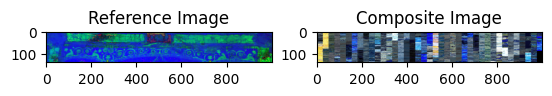

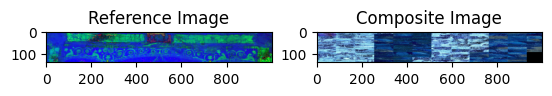

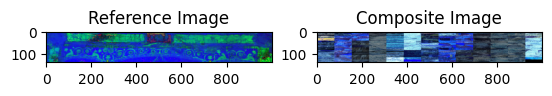

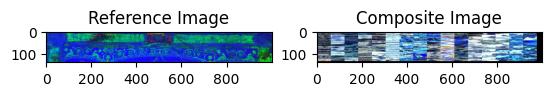

Cluster: cluster_0 - Color Similarity: -0.6740359187173428 - Median: 2267.0 - Matches: 1674 - Norm Median: 1.0 - Norm Matches: 0.8847780126849895 - Score: -0.17769037336166613 - Recall: 0.5441176470588235
Cluster: cluster_1 - Color Similarity: -0.8173240165398354 - Median: 2249.0 - Matches: 1516 - Norm Median: 0.992059991177768 - Norm Matches: 0.8012684989429175 - Score: -0.4839042035236194 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.6610179995693122 - Median: 2230.5 - Matches: 1532 - Norm Median: 0.9838994265549184 - Norm Matches: 0.8097251585623678 - Score: -0.39341187274446304 - Recall: 0.04411764705882353
Cluster: cluster_3 - Color Similarity: -0.6201560248883665 - Median: 2220.0 - Matches: 1892 - Norm Median: 0.9792677547419497 - Norm Matches: 1.0 - Score: -0.26098828136986063 - Recall: 0.4117647058823529
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 2 out of 26 - Reference ID 10
------------------------------------------

Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 773.66it/s]


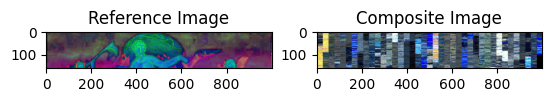

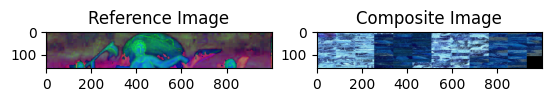

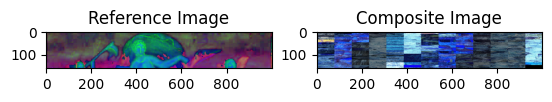

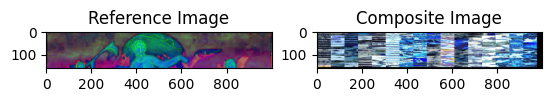

Cluster: cluster_0 - Color Similarity: -0.8940870002262833 - Median: 2533.0 - Matches: 1887 - Norm Median: 1.0 - Norm Matches: 0.8561705989110708 - Score: -0.30201962100309565 - Recall: 0.8191489361702128
Cluster: cluster_1 - Color Similarity: -0.7784672240549356 - Median: 2429.0 - Matches: 1822 - Norm Median: 0.9589419660481643 - Norm Matches: 0.8266787658802178 - Score: -0.43521166124771743 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.7210481560156913 - Median: 2434.5 - Matches: 1730 - Norm Median: 0.9611133043821556 - Norm Matches: 0.7849364791288567 - Score: -0.4244282295980268 - Recall: 0.02127659574468085
Cluster: cluster_3 - Color Similarity: -0.6123207800403356 - Median: 2369.5 - Matches: 2204 - Norm Median: 0.9354520331622582 - Norm Matches: 1.0 - Score: -0.23516279815599941 - Recall: 0.1595744680851064
Chosen: cluster_3 - Actual: cluster_0
---------------------------------------------
Iteration 3 out of 26 - Reference ID 11
-----------------------------------------

Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 802.11it/s]


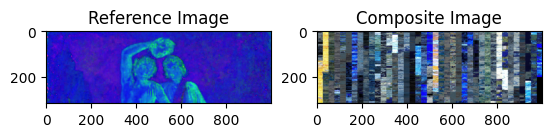

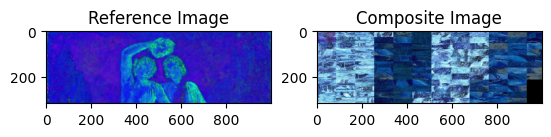

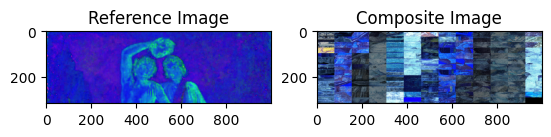

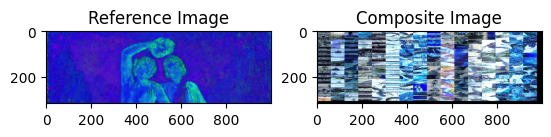

Cluster: cluster_0 - Color Similarity: -0.7643468128244981 - Median: 2546.0 - Matches: 3536 - Norm Median: 1.0 - Norm Matches: 0.8087831655992681 - Score: -0.26084324395810443 - Recall: 0.9770114942528736
Cluster: cluster_1 - Color Similarity: -0.8312300985664415 - Median: 2545.0 - Matches: 3293 - Norm Median: 0.9996072270227808 - Norm Matches: 0.7532021957913998 - Score: -0.5186640140351877 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.7280520012551013 - Median: 2491.0 - Matches: 3519 - Norm Median: 0.9783974862529458 - Norm Matches: 0.8048947849954254 - Score: -0.4265930902198425 - Recall: 0.022988505747126436
Cluster: cluster_3 - Color Similarity: -0.7238556237415018 - Median: 2494.0 - Matches: 4372 - Norm Median: 0.9795758051846033 - Norm Matches: 1.0 - Score: -0.31299210601775507 - Recall: 0.0
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 4 out of 26 - Reference ID 12
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 773.37it/s]


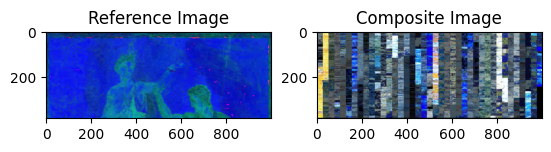

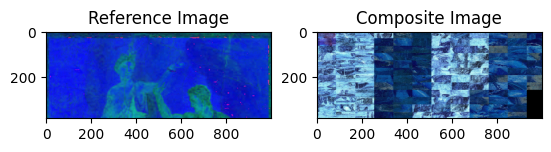

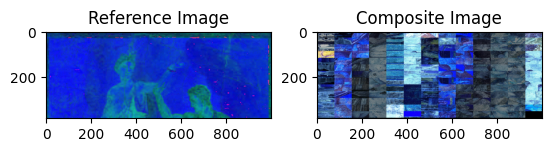

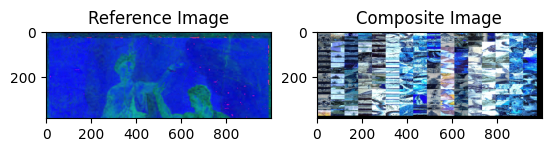

Cluster: cluster_0 - Color Similarity: -0.8242705088220106 - Median: 2813.0 - Matches: 4194 - Norm Median: 1.0 - Norm Matches: 0.7928166351606806 - Score: -0.2987883571761544 - Recall: 1.0
Cluster: cluster_1 - Color Similarity: -0.8902197774981024 - Median: 2812.0 - Matches: 3961 - Norm Median: 0.9996445076430857 - Norm Matches: 0.7487712665406427 - Score: -0.550392958436549 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.8151125003187429 - Median: 2793.0 - Matches: 4111 - Norm Median: 0.9928901528617134 - Norm Matches: 0.7771266540642722 - Score: -0.4912537385216238 - Recall: 0.0
Cluster: cluster_3 - Color Similarity: -0.7878784443784743 - Median: 2809.0 - Matches: 5290 - Norm Median: 0.9985780305723427 - Norm Matches: 1.0 - Score: -0.35450462903011104 - Recall: 0.0
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 5 out of 26 - Reference ID 13
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 760.76it/s]


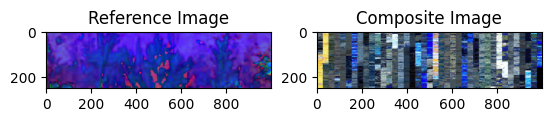

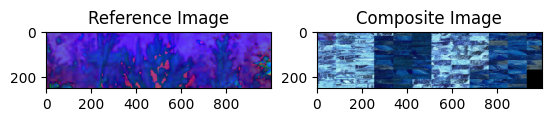

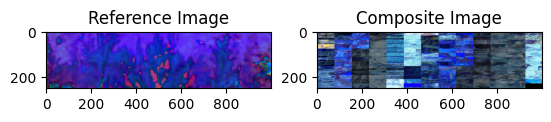

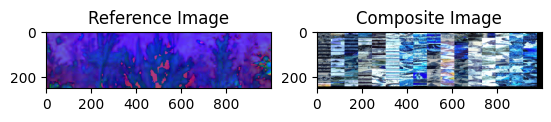

Cluster: cluster_0 - Color Similarity: -0.5614393656515954 - Median: 2674.0 - Matches: 2703 - Norm Median: 0.9881744271988174 - Norm Matches: 0.8061437518640023 - Score: -0.15479644083869468 - Recall: 0.7564102564102564
Cluster: cluster_1 - Color Similarity: -0.7499132127474719 - Median: 2678.0 - Matches: 2670 - Norm Median: 0.9896526237989652 - Norm Matches: 0.7963018192663287 - Score: -0.4514784577763306 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.5229924273959381 - Median: 2663.0 - Matches: 2792 - Norm Median: 0.984109386548411 - Norm Matches: 0.8326871458395467 - Score: -0.31302307301593285 - Recall: 0.0
Cluster: cluster_3 - Color Similarity: -0.4858762415578429 - Median: 2706.0 - Matches: 3353 - Norm Median: 1.0 - Norm Matches: 1.0 - Score: -0.20421451233362395 - Recall: 0.24358974358974358
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 6 out of 26 - Reference ID 14
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 771.82it/s]


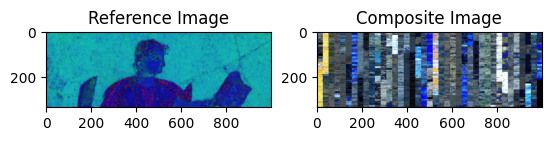

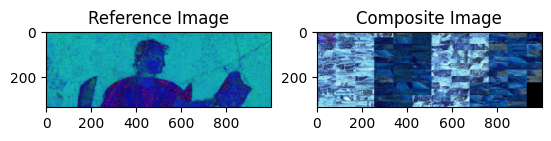

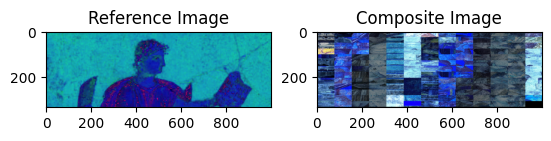

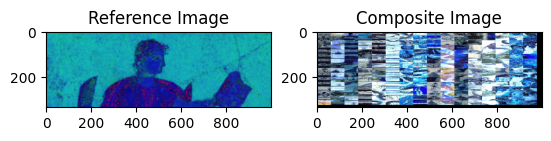

Cluster: cluster_0 - Color Similarity: -0.8665717155164577 - Median: 2560.0 - Matches: 3676 - Norm Median: 0.9870830923462502 - Norm Matches: 0.7905376344086021 - Score: -0.31462000707254234 - Recall: 1.0
Cluster: cluster_1 - Color Similarity: -0.9241014156356219 - Median: 2593.5 - Matches: 3422 - Norm Median: 1.0 - Norm Matches: 0.7359139784946237 - Score: -0.5739401677067755 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.8478809402075727 - Median: 2579.0 - Matches: 3617 - Norm Median: 0.9944090996722575 - Norm Matches: 0.7778494623655914 - Score: -0.5080360277206512 - Recall: 0.0
Cluster: cluster_3 - Color Similarity: -0.8420902499885817 - Median: 2570.0 - Matches: 4650 - Norm Median: 0.9909388856757277 - Norm Matches: 1.0 - Score: -0.37779095938685725 - Recall: 0.0
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 7 out of 26 - Reference ID 15
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 760.99it/s]


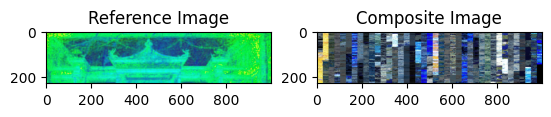

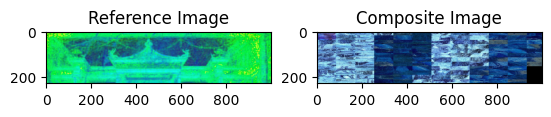

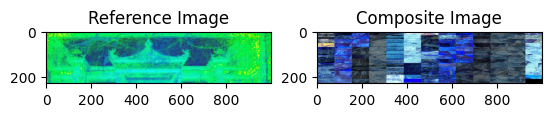

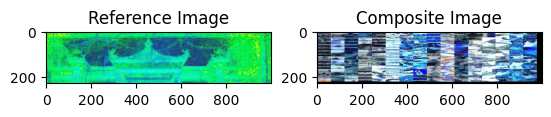

Cluster: cluster_0 - Color Similarity: -0.6520723653154032 - Median: 2366.0 - Matches: 2503 - Norm Median: 1.0 - Norm Matches: 0.8447519406007425 - Score: -0.1867216327028198 - Recall: 0.6025641025641025
Cluster: cluster_1 - Color Similarity: -0.7607160420664303 - Median: 2343.0 - Matches: 2456 - Norm Median: 0.9902789518174133 - Norm Matches: 0.8288896388795141 - Score: -0.44089912663844116 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.5909585787509217 - Median: 2285.0 - Matches: 2566 - Norm Median: 0.9657650042265427 - Norm Matches: 0.8660141748228147 - Score: -0.3211704430408565 - Recall: 0.3076923076923077
Cluster: cluster_3 - Color Similarity: -0.5840686285179091 - Median: 2267.0 - Matches: 2963 - Norm Median: 0.9581572273879966 - Norm Matches: 1.0 - Score: -0.23238931950765532 - Recall: 0.08974358974358974
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 8 out of 26 - Reference ID 16
------------------------------------------

Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 768.92it/s]


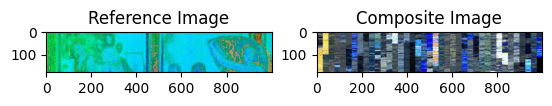

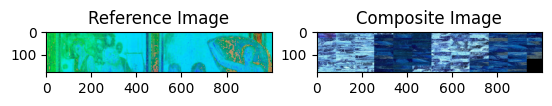

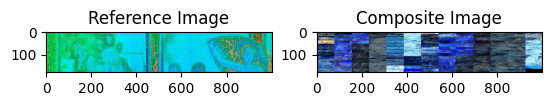

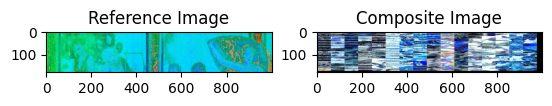

Cluster: cluster_0 - Color Similarity: -0.7643404070545726 - Median: 2379.0 - Matches: 2091 - Norm Median: 1.0 - Norm Matches: 0.85661614092585 - Score: -0.23692355340985075 - Recall: 0.5617977528089888
Cluster: cluster_1 - Color Similarity: -0.8380140985663738 - Median: 2296.5 - Matches: 1924 - Norm Median: 0.9653215636822194 - Norm Matches: 0.7882015567390414 - Score: -0.48741350189105237 - Recall: 0.02247191011235955
Cluster: cluster_2 - Color Similarity: -0.7150630988686457 - Median: 2273.0 - Matches: 2080 - Norm Median: 0.955443463640185 - Norm Matches: 0.8521097910692339 - Score: -0.3850141246833301 - Recall: 0.3707865168539326
Cluster: cluster_3 - Color Similarity: -0.7265130082918296 - Median: 2238.0 - Matches: 2441 - Norm Median: 0.9407313997477932 - Norm Matches: 1.0 - Score: -0.2948985955745139 - Recall: 0.0449438202247191
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 9 out of 26 - Reference ID 17
------------------------------

Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 716.47it/s]


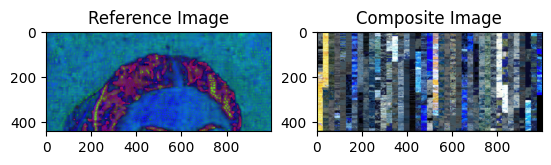

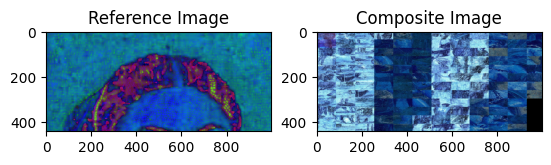

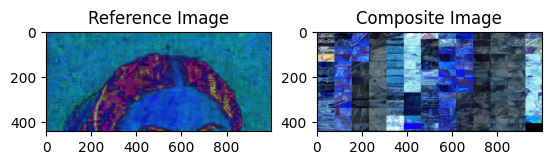

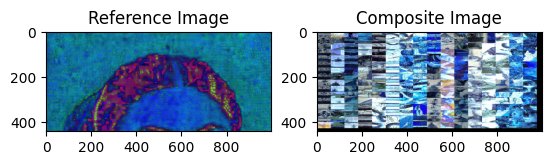

Cluster: cluster_0 - Color Similarity: -0.7364386467809549 - Median: 2436.5 - Matches: 4800 - Norm Median: 0.9832526230831315 - Norm Matches: 0.7798537774167343 - Score: -0.25298016656916555 - Recall: 1.0
Cluster: cluster_1 - Color Similarity: -0.8759554411979965 - Median: 2478.0 - Matches: 4584 - Norm Median: 1.0 - Norm Matches: 0.7447603574329813 - Score: -0.545443991018784 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.7129650740343816 - Median: 2438.0 - Matches: 4546 - Norm Median: 0.9838579499596449 - Norm Matches: 0.7385865150284322 - Score: -0.45493399344632884 - Recall: 0.0
Cluster: cluster_3 - Color Similarity: -0.7003196056001335 - Median: 2448.0 - Matches: 6155 - Norm Median: 0.9878934624697336 - Norm Matches: 1.0 - Score: -0.3053829255896361 - Recall: 0.0
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 10 out of 26 - Reference ID 18
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 751.63it/s]


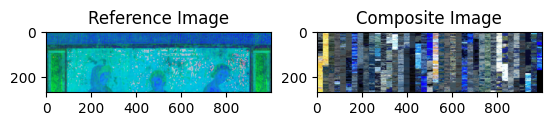

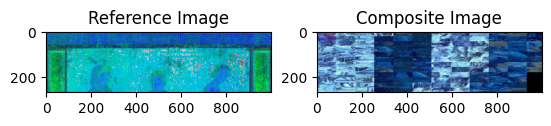

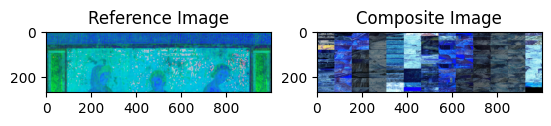

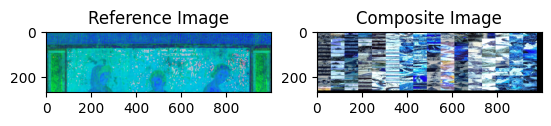

Cluster: cluster_0 - Color Similarity: -0.6713748125355907 - Median: 2374.0 - Matches: 2943 - Norm Median: 1.0 - Norm Matches: 0.8049781181619255 - Score: -0.21625976753232204 - Recall: 0.625
Cluster: cluster_1 - Color Similarity: -0.7807269828032469 - Median: 2361.0 - Matches: 2798 - Norm Median: 0.9945240101095199 - Norm Matches: 0.7653172866520788 - Score: -0.48481330226662034 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.6146435837777013 - Median: 2342.0 - Matches: 2940 - Norm Median: 0.9865206402695872 - Norm Matches: 0.8041575492341356 - Score: -0.37431907637010814 - Recall: 0.375
Cluster: cluster_3 - Color Similarity: -0.6144124160469544 - Median: 2302.0 - Matches: 3656 - Norm Median: 0.9696714406065712 - Norm Matches: 1.0 - Score: -0.2533183198814653 - Recall: 0.0
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 11 out of 26 - Reference ID 19
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 703.57it/s]


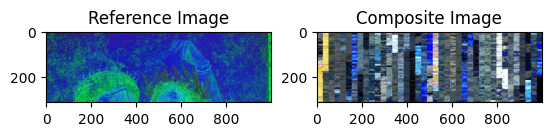

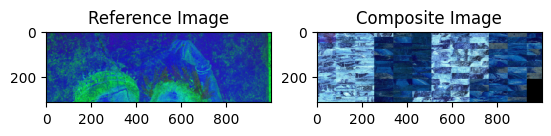

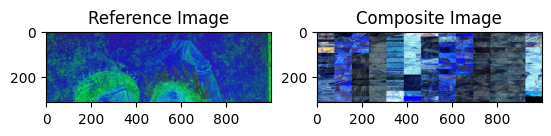

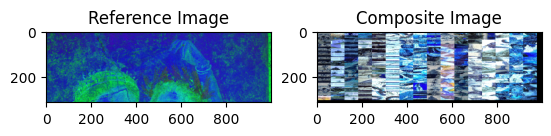

Cluster: cluster_0 - Color Similarity: -0.7320749574864818 - Median: 2354.0 - Matches: 3370 - Norm Median: 1.0 - Norm Matches: 0.7734679825568052 - Score: -0.26236490781032773 - Recall: 0.5465116279069767
Cluster: cluster_1 - Color Similarity: -0.8802280537406281 - Median: 2348.0 - Matches: 3194 - Norm Median: 0.9974511469838573 - Norm Matches: 0.7330732155152628 - Score: -0.5521494417408876 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.7291009512335919 - Median: 2316.5 - Matches: 3428 - Norm Median: 0.9840696686491079 - Norm Matches: 0.786779894422768 - Score: -0.4390111016934976 - Recall: 0.45348837209302323
Cluster: cluster_3 - Color Similarity: -0.6905669040653397 - Median: 2328.0 - Matches: 4357 - Norm Median: 0.9889549702633815 - Norm Matches: 1.0 - Score: -0.30103732871906314 - Recall: 0.0
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 12 out of 26 - Reference ID 2
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 709.77it/s]


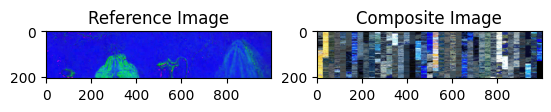

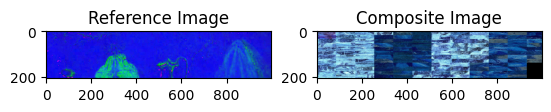

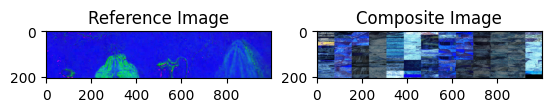

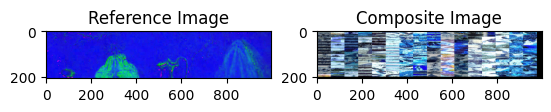

Cluster: cluster_0 - Color Similarity: -0.905139010521035 - Median: 2543.0 - Matches: 2351 - Norm Median: 1.0 - Norm Matches: 0.8348721590909091 - Score: -0.31819484606055237 - Recall: 0.8214285714285714
Cluster: cluster_1 - Color Similarity: -0.913321593995352 - Median: 2487.0 - Matches: 2225 - Norm Median: 0.9779787652379079 - Norm Matches: 0.7901278409090909 - Score: -0.5304327082983609 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.8970585859989418 - Median: 2466.0 - Matches: 2370 - Norm Median: 0.9697208022021234 - Norm Matches: 0.8416193181818182 - Score: -0.48839577397315515 - Recall: 0.023809523809523808
Cluster: cluster_3 - Color Similarity: -0.8685899286545271 - Median: 2465.5 - Matches: 2816 - Norm Median: 0.9695241840346048 - Norm Matches: 1.0 - Score: -0.3803334478992685 - Recall: 0.15476190476190477
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 13 out of 26 - Reference ID 20
-----------------------------------------

Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 731.13it/s]


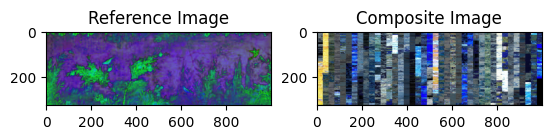

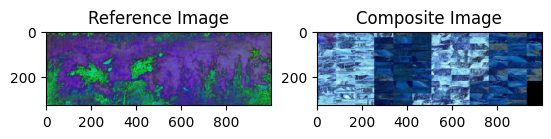

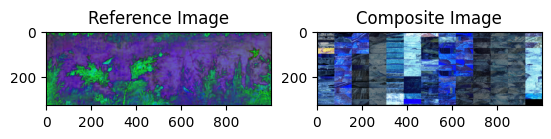

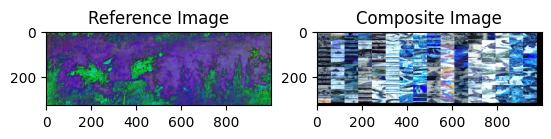

Cluster: cluster_0 - Color Similarity: -0.7753384463948925 - Median: 2321.0 - Matches: 3540 - Norm Median: 0.9969931271477663 - Norm Matches: 0.7917691791545516 - Score: -0.27334261753954303 - Recall: 0.8068181818181818
Cluster: cluster_1 - Color Similarity: -0.780360013996621 - Median: 2328.0 - Matches: 3359 - Norm Median: 1.0 - Norm Matches: 0.7512860657571013 - Score: -0.49438342325603624 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.7719884486434963 - Median: 2309.0 - Matches: 3598 - Norm Median: 0.9918384879725086 - Norm Matches: 0.8047416685305301 - Score: -0.4553583730062691 - Recall: 0.10227272727272728
Cluster: cluster_3 - Color Similarity: -0.6310094033599638 - Median: 2325.0 - Matches: 4471 - Norm Median: 0.9987113402061856 - Norm Matches: 1.0 - Score: -0.2761367633377772 - Recall: 0.09090909090909091
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 14 out of 26 - Reference ID 21
-----------------------------------------

Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 706.73it/s]


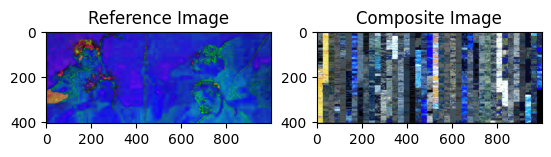

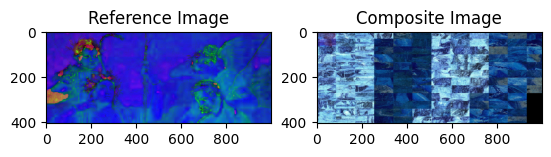

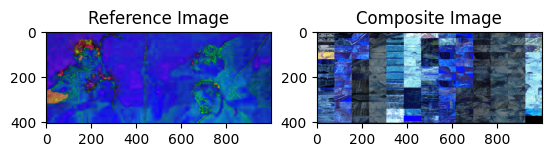

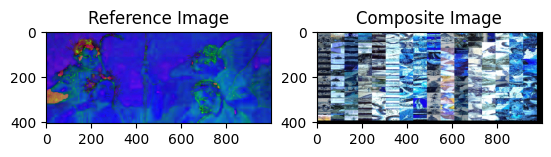

Cluster: cluster_0 - Color Similarity: -0.7051539063988342 - Median: 2563.0 - Matches: 4385 - Norm Median: 0.9941815360744763 - Norm Matches: 0.7833154698106467 - Score: -0.2410714066768214 - Recall: 0.9375
Cluster: cluster_1 - Color Similarity: -0.8194937348450462 - Median: 2571.0 - Matches: 4094 - Norm Median: 0.9972847168347556 - Norm Matches: 0.7313326187924258 - Score: -0.5225693655799644 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.6771268008178007 - Median: 2557.5 - Matches: 4284 - Norm Median: 0.9920480993017843 - Norm Matches: 0.7652733118971061 - Score: -0.42776653307477114 - Recall: 0.0
Cluster: cluster_3 - Color Similarity: -0.6573621042303814 - Median: 2578.0 - Matches: 5598 - Norm Median: 1.0 - Norm Matches: 1.0 - Score: -0.28995744366989323 - Recall: 0.0625
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 15 out of 26 - Reference ID 22
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 718.82it/s]


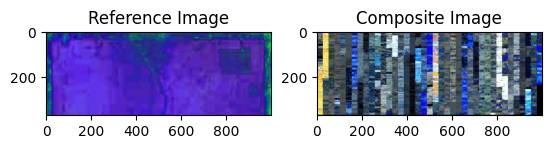

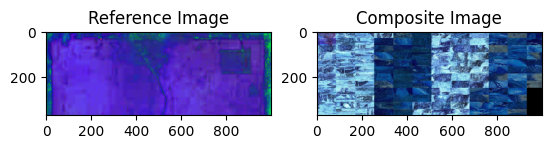

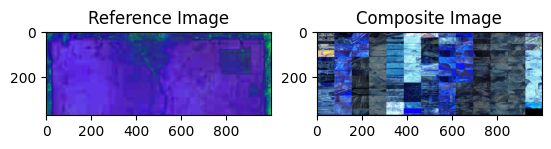

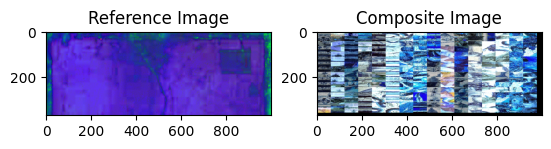

Cluster: cluster_0 - Color Similarity: -0.7678477794011911 - Median: 2714.0 - Matches: 4103 - Norm Median: 0.9926847110460864 - Norm Matches: 0.79515503875969 - Score: -0.26575014618928317 - Recall: 0.6125
Cluster: cluster_1 - Color Similarity: -0.844553649927428 - Median: 2734.0 - Matches: 3861 - Norm Median: 1.0 - Norm Matches: 0.7482558139534884 - Score: -0.5279953671232462 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.7378247840460384 - Median: 2701.0 - Matches: 3894 - Norm Median: 0.9879297732260425 - Norm Matches: 0.7546511627906977 - Score: -0.46136743620422327 - Recall: 0.0
Cluster: cluster_3 - Color Similarity: -0.7212520227460724 - Median: 2696.0 - Matches: 5160 - Norm Median: 0.986100950987564 - Norm Matches: 1.0 - Score: -0.3149528784215207 - Recall: 0.3875
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 16 out of 26 - Reference ID 23
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 733.80it/s]


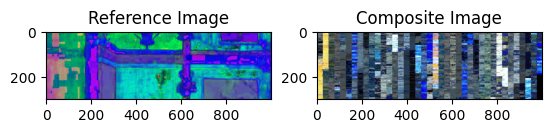

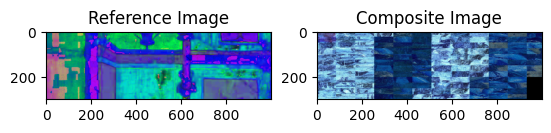

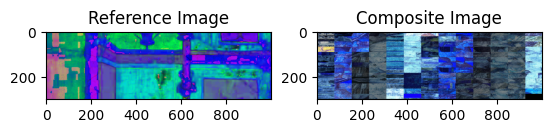

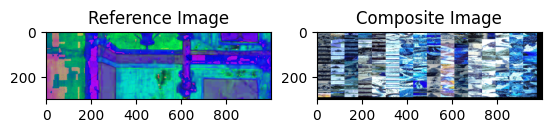

Cluster: cluster_0 - Color Similarity: -0.23371016860940286 - Median: 2407.5 - Matches: 3270 - Norm Median: 0.9956575682382134 - Norm Matches: 0.8068097705403405 - Score: 0.005659596500872693 - Recall: 0.9305555555555556
Cluster: cluster_1 - Color Similarity: -0.4354466655606124 - Median: 2418.0 - Matches: 3050 - Norm Median: 1.0 - Norm Matches: 0.7525289908709598 - Score: -0.3213052864811027 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.10090959491333773 - Median: 2373.0 - Matches: 3321 - Norm Median: 0.9813895781637717 - Norm Matches: 0.8193930421909696 - Score: -0.10726880440660157 - Recall: 0.0
Cluster: cluster_3 - Color Similarity: -0.06212413038497788 - Median: 2342.0 - Matches: 4053 - Norm Median: 0.9685690653432589 - Norm Matches: 1.0 - Score: 0.0233770105811791 - Recall: 0.06944444444444445
Chosen: cluster_3 - Actual: cluster_0
---------------------------------------------
Iteration 17 out of 26 - Reference ID 24
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 723.66it/s]


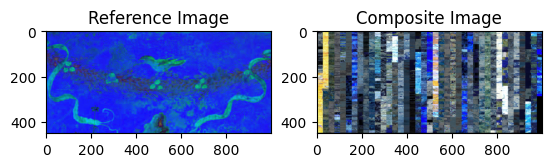

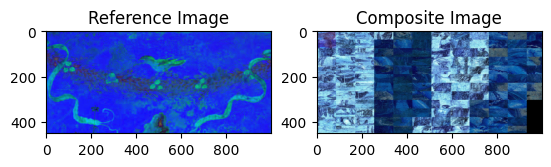

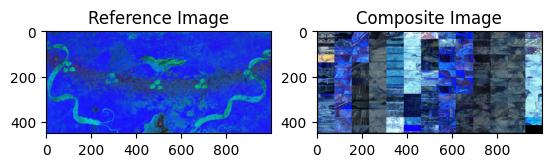

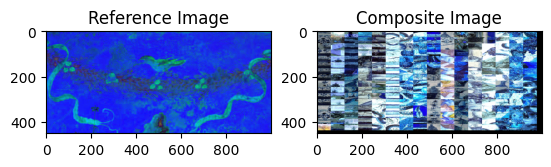

Cluster: cluster_0 - Color Similarity: -0.8373922147710423 - Median: 2456.0 - Matches: 4849 - Norm Median: 0.9827931172468988 - Norm Matches: 0.7726258763543659 - Score: -0.30684114817727703 - Recall: 0.2916666666666667
Cluster: cluster_1 - Color Similarity: -0.874217912595305 - Median: 2499.0 - Matches: 4753 - Norm Median: 1.0 - Norm Matches: 0.7573295092415552 - Score: -0.5382906508131513 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.8319616665922261 - Median: 2439.0 - Matches: 4656 - Norm Median: 0.9759903961584634 - Norm Matches: 0.7418738049713193 - Score: -0.5088548678532169 - Recall: 0.08333333333333333
Cluster: cluster_3 - Color Similarity: -0.7874299853999904 - Median: 2453.0 - Matches: 6276 - Norm Median: 0.9815926370548219 - Norm Matches: 1.0 - Score: -0.3457877027821087 - Recall: 0.625
Chosen: cluster_0 - Actual: cluster_3
---------------------------------------------
Iteration 18 out of 26 - Reference ID 25
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 747.62it/s]


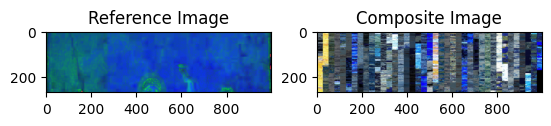

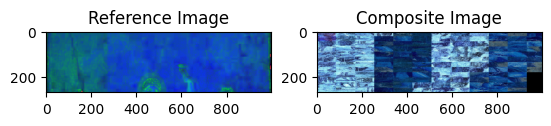

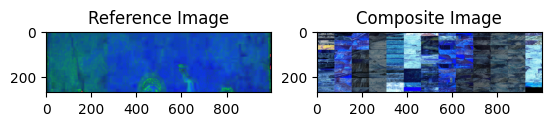

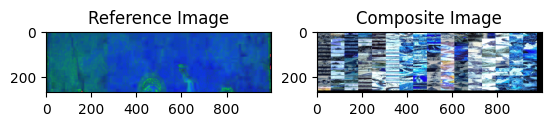

Cluster: cluster_0 - Color Similarity: -0.8363871814498562 - Median: 3153.0 - Matches: 2919 - Norm Median: 1.0 - Norm Matches: 0.7945019052803484 - Score: -0.30400405843024336 - Recall: 1.0
Cluster: cluster_1 - Color Similarity: -0.922981320996756 - Median: 3080.0 - Matches: 2743 - Norm Median: 0.9768474468759911 - Norm Matches: 0.746597713663582 - Score: -0.5564619762408589 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.8232803391309966 - Median: 3088.5 - Matches: 2880 - Norm Median: 0.9795432921027593 - Norm Matches: 0.783886771910724 - Score: -0.48528416862504764 - Recall: 0.0
Cluster: cluster_3 - Color Similarity: -0.8238916504169211 - Median: 3097.5 - Matches: 3674 - Norm Median: 0.9823977164605138 - Norm Matches: 1.0 - Score: -0.36442107499341997 - Recall: 0.0
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 19 out of 26 - Reference ID 26
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 730.28it/s]


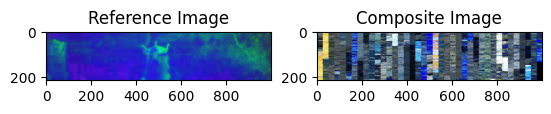

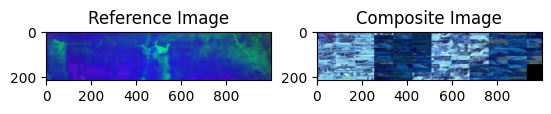

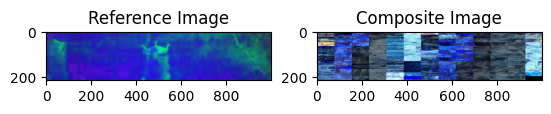

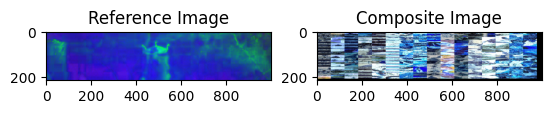

Cluster: cluster_0 - Color Similarity: -0.7427666817713652 - Median: 3098.0 - Matches: 2382 - Norm Median: 0.9752872658586494 - Norm Matches: 0.8279457768508863 - Score: -0.2281155057350536 - Recall: 0.9642857142857143
Cluster: cluster_1 - Color Similarity: -0.8381941826150853 - Median: 3176.5 - Matches: 2288 - Norm Median: 1.0 - Norm Matches: 0.7952728536670143 - Score: -0.5013071136103119 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.729320967238241 - Median: 3148.0 - Matches: 2347 - Norm Median: 0.9910278608531402 - Norm Matches: 0.8157803267292318 - Score: -0.4280999896446064 - Recall: 0.0
Cluster: cluster_3 - Color Similarity: -0.7033029258608398 - Median: 3165.0 - Matches: 2877 - Norm Median: 0.9963796631512671 - Norm Matches: 1.0 - Score: -0.31111768606075596 - Recall: 0.03571428571428571
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 20 out of 26 - Reference ID 3
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 738.94it/s]


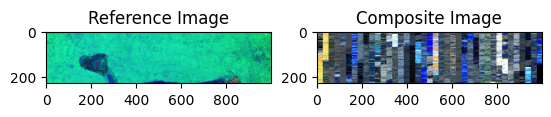

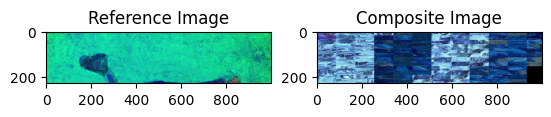

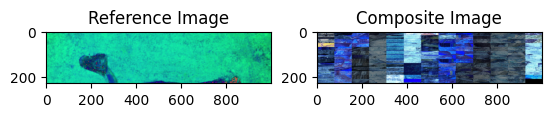

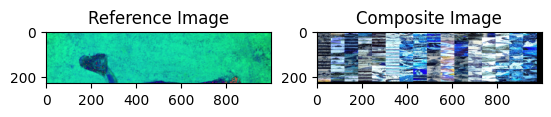

Cluster: cluster_0 - Color Similarity: -0.8541824634585129 - Median: 2573.0 - Matches: 2503 - Norm Median: 0.9982541222114452 - Norm Matches: 0.8447519406007425 - Score: -0.28690374288009723 - Recall: 1.0
Cluster: cluster_1 - Color Similarity: -0.9042711729508727 - Median: 2577.5 - Matches: 2456 - Norm Median: 1.0 - Norm Matches: 0.8288896388795141 - Score: -0.5175372161719557 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.8242587812470739 - Median: 2563.0 - Matches: 2566 - Norm Median: 0.9943743937924345 - Norm Matches: 0.8660141748228147 - Score: -0.4521252390718785 - Recall: 0.0
Cluster: cluster_3 - Color Similarity: -0.8272409140269554 - Median: 2570.0 - Matches: 2963 - Norm Median: 0.997090203685742 - Norm Matches: 1.0 - Score: -0.3734419504110512 - Recall: 0.0
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 21 out of 26 - Reference ID 4
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 729.48it/s]


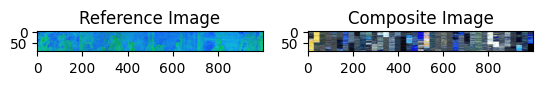

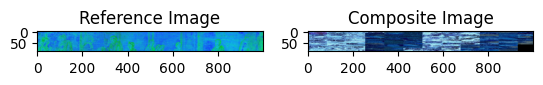

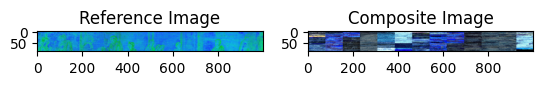

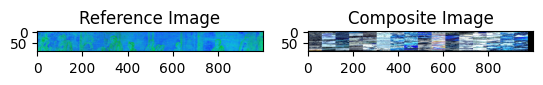

Cluster: cluster_0 - Color Similarity: -0.8065131569153532 - Median: 3088.5 - Matches: 938 - Norm Median: 0.997577519379845 - Norm Matches: 0.8017094017094017 - Score: -0.2842520576383877 - Recall: 0.0
Cluster: cluster_1 - Color Similarity: -0.8590660837854944 - Median: 3037.0 - Matches: 1034 - Norm Median: 0.9809431524547804 - Norm Matches: 0.8837606837606837 - Score: -0.4579707253760719 - Recall: 0.8214285714285714
Cluster: cluster_2 - Color Similarity: -0.7734727541959947 - Median: 3056.0 - Matches: 966 - Norm Median: 0.9870801033591732 - Norm Matches: 0.8256410256410256 - Score: -0.44327165492060283 - Recall: 0.17857142857142858
Cluster: cluster_3 - Color Similarity: -0.7737647252446678 - Median: 3096.0 - Matches: 1170 - Norm Median: 1.0 - Norm Matches: 1.0 - Score: -0.3481587541770364 - Recall: 0.0
Chosen: cluster_0 - Actual: cluster_1
---------------------------------------------
Iteration 22 out of 26 - Reference ID 5
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:03<00:00, 686.86it/s]


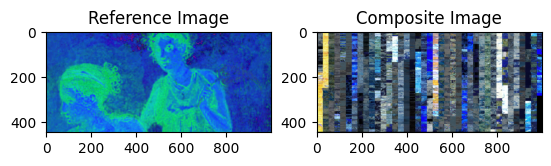

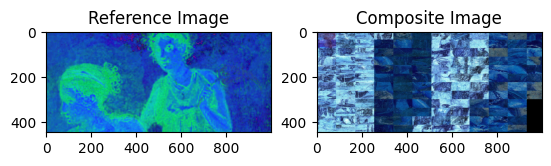

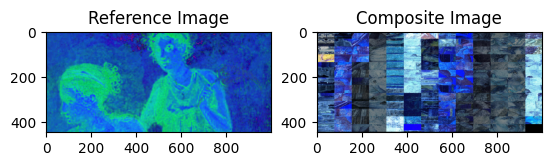

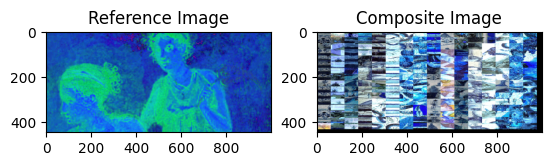

Cluster: cluster_0 - Color Similarity: -0.6925295421937707 - Median: 2478.0 - Matches: 4836 - Norm Median: 0.9884323893099322 - Norm Matches: 0.7802516940948693 - Score: -0.23341653904990625 - Recall: 0.0
Cluster: cluster_1 - Color Similarity: -0.8267879673932725 - Median: 2507.0 - Matches: 4686 - Norm Median: 1.0 - Norm Matches: 0.7560503388189739 - Score: -0.5152152634234257 - Recall: 0.9583333333333334
Cluster: cluster_2 - Color Similarity: -0.6652904055764856 - Median: 2479.0 - Matches: 4730 - Norm Median: 0.988831272437176 - Norm Matches: 0.7631494030332365 - Score: -0.4213018764537442 - Recall: 0.041666666666666664
Cluster: cluster_3 - Color Similarity: -0.6585327829147967 - Median: 2481.0 - Matches: 6198 - Norm Median: 0.9896290386916633 - Norm Matches: 1.0 - Score: -0.2853573023579325 - Recall: 0.0
Chosen: cluster_0 - Actual: cluster_1
---------------------------------------------
Iteration 23 out of 26 - Reference ID 6
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:03<00:00, 686.44it/s]


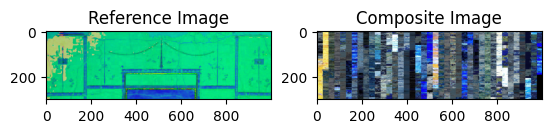

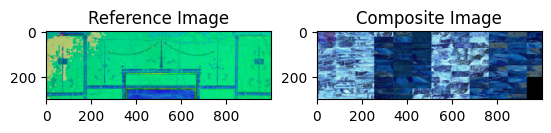

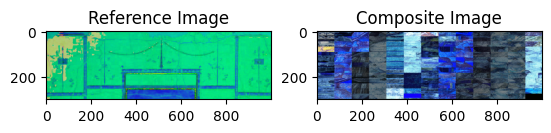

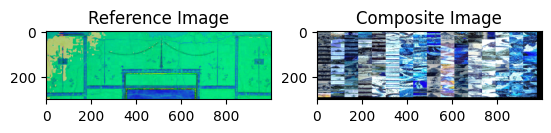

Cluster: cluster_0 - Color Similarity: -0.8137578276681838 - Median: 2406.0 - Matches: 3372 - Norm Median: 0.9991694352159468 - Norm Matches: 0.8234432234432234 - Score: -0.27780344006594304 - Recall: 1.0
Cluster: cluster_1 - Color Similarity: -0.8686295669159864 - Median: 2408.0 - Matches: 3176 - Norm Median: 1.0 - Norm Matches: 0.7755799755799756 - Score: -0.5263712448042818 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.7744435507743077 - Median: 2359.0 - Matches: 3347 - Norm Median: 0.9796511627906976 - Norm Matches: 0.8173382173382173 - Score: -0.4441939870769257 - Recall: 0.0
Cluster: cluster_3 - Color Similarity: -0.7789053479726484 - Median: 2329.0 - Matches: 4095 - Norm Median: 0.9671926910299004 - Norm Matches: 1.0 - Score: -0.3343254110559769 - Recall: 0.0
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 24 out of 26 - Reference ID 7
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 749.76it/s]


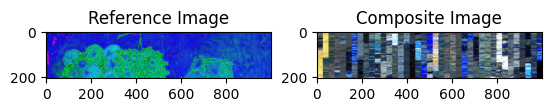

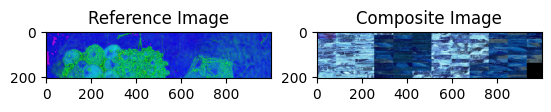

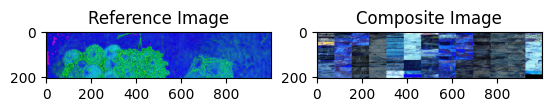

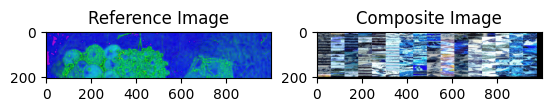

Cluster: cluster_0 - Color Similarity: -0.7440318864548454 - Median: 2463.0 - Matches: 2311 - Norm Median: 1.0 - Norm Matches: 0.8403636363636363 - Score: -0.234895545391094 - Recall: 0.3614457831325301
Cluster: cluster_1 - Color Similarity: -0.8231673147153401 - Median: 2434.0 - Matches: 2245 - Norm Median: 0.9882257409663012 - Norm Matches: 0.8163636363636364 - Score: -0.47736115879527885 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.7098321585585663 - Median: 2434.0 - Matches: 2250 - Norm Median: 0.9882257409663012 - Norm Matches: 0.8181818181818182 - Score: -0.41575377963505633 - Recall: 0.012048192771084338
Cluster: cluster_3 - Color Similarity: -0.7034577656281693 - Median: 2457.0 - Matches: 2750 - Norm Median: 0.997563946406821 - Norm Matches: 1.0 - Score: -0.31178724757219767 - Recall: 0.6265060240963856
Chosen: cluster_0 - Actual: cluster_3
---------------------------------------------
Iteration 25 out of 26 - Reference ID 8
------------------------------------------

Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 727.21it/s]


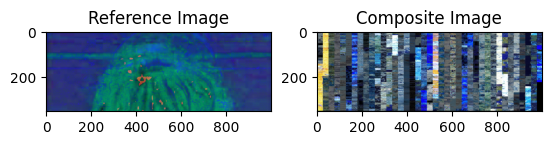

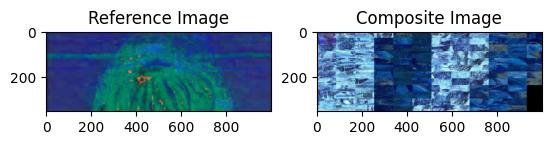

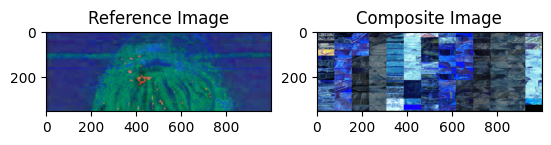

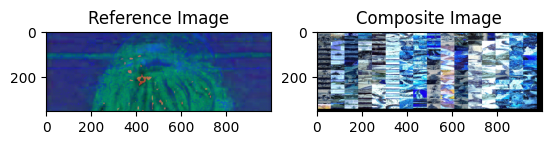

Cluster: cluster_0 - Color Similarity: -0.8382743301875968 - Median: 2860.0 - Matches: 3940 - Norm Median: 1.0 - Norm Matches: 0.8135453231468098 - Score: -0.29542592386588284 - Recall: 1.0
Cluster: cluster_1 - Color Similarity: -0.9302423517907592 - Median: 2851.0 - Matches: 3613 - Norm Median: 0.9968531468531469 - Norm Matches: 0.7460251909973157 - Score: -0.5703816029595716 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.8529291423138364 - Median: 2796.0 - Matches: 3770 - Norm Median: 0.9776223776223776 - Norm Matches: 0.7784431137724551 - Score: -0.5018699420454111 - Recall: 0.0
Cluster: cluster_3 - Color Similarity: -0.7983092047873361 - Median: 2814.0 - Matches: 4843 - Norm Median: 0.9839160839160839 - Norm Matches: 1.0 - Score: -0.3523890359064125 - Recall: 0.0
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------
Iteration 26 out of 26 - Reference ID 9
---------------------------------------------


Creating cluster dirs: 100%|██████████| 2084/2084 [00:02<00:00, 738.78it/s]


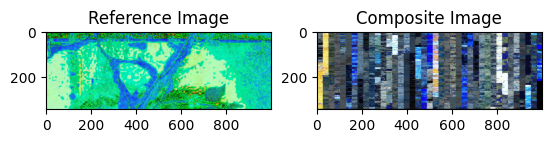

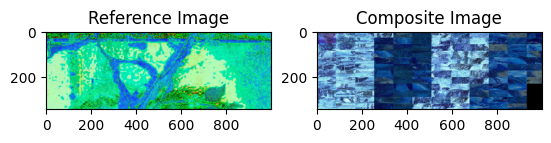

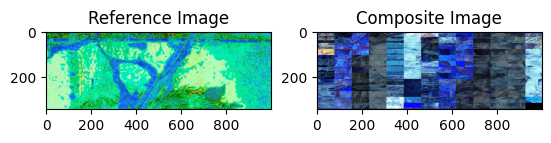

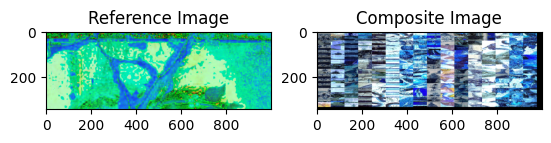

Cluster: cluster_0 - Color Similarity: -0.6986808357371086 - Median: 2284.0 - Matches: 3741 - Norm Median: 0.9973799126637555 - Norm Matches: 0.781328320802005 - Score: -0.240427634144919 - Recall: 0.5662650602409639
Cluster: cluster_1 - Color Similarity: -0.789072914057251 - Median: 2290.0 - Matches: 3545 - Norm Median: 1.0 - Norm Matches: 0.7403926482873852 - Score: -0.5041865820212093 - Recall: 0.0
Cluster: cluster_2 - Color Similarity: -0.6360493423242539 - Median: 2267.5 - Matches: 3718 - Norm Median: 0.990174672489083 - Norm Matches: 0.7765246449456976 - Score: -0.4006654238973513 - Recall: 0.024096385542168676
Cluster: cluster_3 - Color Similarity: -0.6420464649818987 - Median: 2258.0 - Matches: 4788 - Norm Median: 0.9860262008733625 - Norm Matches: 1.0 - Score: -0.27531272448233307 - Recall: 0.40963855421686746
Chosen: cluster_0 - Actual: cluster_0
---------------------------------------------


Terminated!


Correct IN cluster selected: 20/26 --- 76.92307692307693%


In [44]:
n_references = len(reference_images_ids)

#ks = [2, 3, 4, 5, 6, 7, 8]
# remove empty bins and reshape the histograms to have the same shape
# color_histograms = remove_empty_bins(color_histograms)

# for k in tqdm(ks, desc="Finding best K"):
#   correct_guesses = 0

metrics = {}

correct_guesses = 0

for i in range(n_references):
  reference_id = reference_images_ids[i]
  reference_image = reference_images[i][: , :, :3]  # consider only B,G,R channels
  reference_image = cv.cvtColor(reference_image, cv.COLOR_BGR2HSV)

  print(f"Iteration {i + 1} out of {n_references} - Reference ID {reference_id}")
  print("---------------------------------------------")

  reference_color_histogram = cv.calcHist([reference_image], [0, 1, 2], None, (8, 8, 8), [0, 256, 0, 256, 0, 256])
  cv.normalize(reference_color_histogram, reference_color_histogram, alpha=0, beta=1, norm_type=cv.NORM_MINMAX)

  X = []
  intersections = []
  for i in tqdm(range(len(color_histograms)), desc="Creating fit dataset", total=len(color_histograms)):
    intersection = cv.compareHist(reference_color_histogram, color_histograms[i], cv.HISTCMP_INTERSECT) / np.sum(color_histograms[i])
    X.append(np.hstack((intersection, feats[i].reshape(-1))))

  X = np.array(X)

  kmeans = KMeans(n_clusters=4, random_state=seed, n_init="auto")
  fit_kmeans = kmeans.fit(X)

  create_cluster_dirs(fragments_paths, output_dir=output_dir, labels=fit_kmeans.labels_)
  # choose the IN Cluster, i.e., the cluster with the most fragments of the reference image
  IN_cluster_dir, correct_IN_cluster_dir, max_recall = define_IN_cluster(reference_image=reference_image, reference_id=reference_id, root_dir=output_dir, grid_size=grid_size, color_weights=color_weights, choice_weights=choice_weights)

  print(f"Chosen: {IN_cluster_dir} - Actual: {correct_IN_cluster_dir}")
  # track the number of times the algorithm chooses the right IN cluster
  if correct_IN_cluster_dir == IN_cluster_dir:
    correct_guesses += 1

  # filter out the fragments needed
  cluster_filenames = os.listdir(os.path.join(output_dir, IN_cluster_dir))
  cluster_indexes = [fragments_order[filename] for filename in cluster_filenames if filename in fragments_order]
  # filtered_working_regions = working_region_fragments_dataset[cluster_indexes]
  filtered_original_fragments = original_fragments_dataset[cluster_indexes]
  filtered_X = X[cluster_indexes]
  metrics[reference_id] = {
          "max_recall": max_recall,
          "chosen_IN_cluster_recall": recall_in_out_clusters(reference_id, output_dir, [IN_cluster_dir]),
          "fragments_chosen_IN_cluster": len(os.listdir(os.path.join(output_dir, IN_cluster_dir))),
          "chosen_IN_cluster": IN_cluster_dir,
          "correct_IN_cluster": correct_IN_cluster_dir,
          "fragments_correct_In_cluster": len(os.listdir(os.path.join(output_dir, correct_IN_cluster_dir)))
  }

  print("---------------------------------------------")

print("\n\nTerminated!\n\n")
print(f"Correct IN cluster selected: {correct_guesses}/{n_references} --- {(correct_guesses/ n_references) * 100 }%")

metrics["Barbara"] =  {
  "n_guesses": f"{correct_guesses}/{n_references}",
  "percentual": (correct_guesses/ n_references) * 100
}

with open(f"metrics.json", "w") as f:
    json.dump(metrics, f)

# Refined IN clusters

In [29]:
def compute_ssim_scores(in_cluster_path, reference_image, reference_id):
    ssim_scores = []

    reference_image = cv.cvtColor(reference_image, cv.COLOR_BGR2GRAY)
    reference_image = cv.resize(reference_image, (300, 300))
    for fragment_name in tqdm(os.listdir(in_cluster_path), desc=f"Calculating SSIM scores for reference ID {reference_id}"):
        fragment_path = in_cluster_path + os.path.sep + fragment_name
        fragment = cv.imread(fragment_path, cv.IMREAD_UNCHANGED)
        fragment = cv.resize(fragment, (300, 300))
        fragment = cv.cvtColor(fragment, cv.COLOR_BGR2GRAY)

        (score, diff) = structural_similarity(fragment, reference_image, full=True)
        ssim_scores.append({fragment_name:score})

    return ssim_scores

def compute_ssim_scores_hsv(in_cluster_path, reference_image, reference_id):
    ssim_scores = []

    reference_image = cv.cvtColor(reference_image, cv.COLOR_BGR2HSV)
    reference_image = cv.resize(reference_image, (300, 300))
    reference_h, reference_s, reference_v = cv.split(reference_image)

    for fragment_name in tqdm(os.listdir(in_cluster_path), desc=f"Calculating SSIM scores for reference ID {reference_id}"):
        fragment_path = in_cluster_path + os.path.sep + fragment_name
        fragment = cv.imread(fragment_path, cv.IMREAD_UNCHANGED)
        fragment = cv.resize(fragment, (300, 300))
        fragment = cv.cvtColor(fragment, cv.COLOR_BGR2HSV)

        fragment_h, fragment_s, fragment_v = cv.split(fragment)

        (score_h, diff_h) = structural_similarity(fragment_h, reference_h, full=True)
        (score_s, diff_s) = structural_similarity(fragment_s, reference_s, full=True)
        (score_v, diff_v) = structural_similarity(fragment_v, reference_v, full=True)
        score = np.mean([score_h, score_s, score_v])
        ssim_scores.append({fragment_name:score})

    return ssim_scores

In [30]:
path_in_clusters = "in_clusters"
fragments = []
ssim_scores = {}

for idx, in_cluster in tqdm(enumerate(os.listdir(path_in_clusters)), desc=f"Iterate on IN_clusters"):
    in_cluster_path = path_in_clusters + os.path.sep + in_cluster
    reference_image = cv.imread("references" + os.path.sep + "5." + str(idx + 1) + ".jpg", cv.IMREAD_UNCHANGED)
    if idx == 3:
        break
    ssim_scores[f"{idx + 1}"] = compute_ssim_scores_hsv(in_cluster_path, reference_image, idx)

ssim_scores

Iterate on IN_clusters: 0it [00:00, ?it/s]
Calculating SSIM scores for reference ID 0: 100%|██████████| 1507/1507 [00:33<00:00, 45.52it/s]
Iterate on IN_clusters: 1it [00:33, 33.14s/it]
Calculating SSIM scores for reference ID 1: 100%|██████████| 269/269 [00:05<00:00, 48.20it/s]
Iterate on IN_clusters: 2it [00:38, 16.93s/it]
Calculating SSIM scores for reference ID 2: 100%|██████████| 1507/1507 [00:31<00:00, 47.23it/s]
Iterate on IN_clusters: 3it [01:10, 23.56s/it]


{'1': [{'data_Bottom_5.1.1.png': 0.18617522721689664},
  {'data_Bottom_5.1.11.png': 0.2438230775742898},
  {'data_Bottom_5.1.12.png': 0.2628537321192014},
  {'data_Bottom_5.1.14.png': 0.25093445049788166},
  {'data_Bottom_5.1.15.png': 0.22082595328559432},
  {'data_Bottom_5.1.16.png': 0.25422978945146385},
  {'data_Bottom_5.1.17.png': 0.139364397729569},
  {'data_Bottom_5.1.2.png': 0.2716701649925174},
  {'data_Bottom_5.1.20.png': 0.20673402593614978},
  {'data_Bottom_5.1.24.png': 0.2370599169330175},
  {'data_Bottom_5.1.25.png': 0.23453531607959177},
  {'data_Bottom_5.1.27.png': 0.19350874663345893},
  {'data_Bottom_5.1.28.png': 0.1308452739526596},
  {'data_Bottom_5.1.33.png': 0.2550365615918819},
  {'data_Bottom_5.1.7.png': 0.2644034224106429},
  {'data_Bottom_5.1.9.png': 0.26220993235281337},
  {'data_Bottom_5.10.1.png': 0.1475898185149965},
  {'data_Bottom_5.10.10.png': 0.16931138194953324},
  {'data_Bottom_5.10.11.png': 0.14342122793403636},
  {'data_Bottom_5.10.13.png': 0.143598

In [31]:
ssim_scores["1"]

[{'data_Bottom_5.1.1.png': 0.18617522721689664},
 {'data_Bottom_5.1.11.png': 0.2438230775742898},
 {'data_Bottom_5.1.12.png': 0.2628537321192014},
 {'data_Bottom_5.1.14.png': 0.25093445049788166},
 {'data_Bottom_5.1.15.png': 0.22082595328559432},
 {'data_Bottom_5.1.16.png': 0.25422978945146385},
 {'data_Bottom_5.1.17.png': 0.139364397729569},
 {'data_Bottom_5.1.2.png': 0.2716701649925174},
 {'data_Bottom_5.1.20.png': 0.20673402593614978},
 {'data_Bottom_5.1.24.png': 0.2370599169330175},
 {'data_Bottom_5.1.25.png': 0.23453531607959177},
 {'data_Bottom_5.1.27.png': 0.19350874663345893},
 {'data_Bottom_5.1.28.png': 0.1308452739526596},
 {'data_Bottom_5.1.33.png': 0.2550365615918819},
 {'data_Bottom_5.1.7.png': 0.2644034224106429},
 {'data_Bottom_5.1.9.png': 0.26220993235281337},
 {'data_Bottom_5.10.1.png': 0.1475898185149965},
 {'data_Bottom_5.10.10.png': 0.16931138194953324},
 {'data_Bottom_5.10.11.png': 0.14342122793403636},
 {'data_Bottom_5.10.13.png': 0.14359897713683137},
 {'data_Bot

In [32]:
values1 = [list(item.values())[0] for item in ssim_scores["1"]]
min = np.min(values1)
max = np.max(values1)
print(min, max)

0.03483414965531197 0.3192973808985157


In [2]:
in_cluster_path = "in_clusters" + os.path.sep + "in_cluster_1"
fragments = []

for fragment_name in os.listdir(in_cluster_path):
    fragment_path = in_cluster_path + os.path.sep + fragment_name
    fragment = cv.imread(fragment_path, cv.IMREAD_UNCHANGED)
    fragment = cv.resize(fragment, (300, 300))
    fragments.append(fragment)

ssim_scores = compute_ssim_scores_fragment_per_fragment_hsv(fragments[:300])
1 - ssim_scores

Calculating similarities: 100%|██████████| 300/300 [11:18<00:00,  2.26s/it]


array([[0.        , 0.71413177, 0.71475839, ..., 0.71783814, 0.63299309,
        0.67791453],
       [0.71413177, 0.        , 0.50829171, ..., 0.7777982 , 0.70844669,
        0.77266627],
       [0.71475839, 0.50829171, 0.        , ..., 0.75311529, 0.68496999,
        0.76441037],
       ...,
       [0.71783814, 0.7777982 , 0.75311529, ..., 0.        , 0.68959699,
        0.75218036],
       [0.63299309, 0.70844669, 0.68496999, ..., 0.68959699, 0.        ,
        0.6604594 ],
       [0.67791453, 0.77266627, 0.76441037, ..., 0.75218036, 0.6604594 ,
        0.        ]])

In [9]:
# SIFT
sift = cv.SIFT_create()
bf = cv.BFMatcher(cv.NORM_L1, crossCheck = False)

def compute_sift_scores_fragment_per_fragment(fragments: np.ndarray):
    """
    Compute Structural Similarity Index Measure (SSIM) scores between all pairs of image fragments.

    This function computes SSIM scores between each pair of image fragments with respect to a specific reference image.

    Parameters:
        fragments (List[numpy.ndarray]): List of image fragments represented as numpy arrays.

    Returns:
        numpy.ndarray: An array containing SSIM scores between each pair of fragments.
    """
    n_fragments = len(fragments)
    sift_scores = np.ones((n_fragments, n_fragments))

    # compute the SSIM for each fragment with regard to a specific reference image
    for i in (tqdm(range(n_fragments), desc="Calculating similarities")):
        for j in range(i + 1, n_fragments):
            # distance between histograms[i] and histograms[j]
            fragment_i = fragments[i]
            fragment_j = fragments[j]

            fragment_i_keypoints, fragment_i_descriptor = sift.detectAndCompute(fragment_i, None)
            fragment_j_keypoints, fragment_j_descriptor = sift.detectAndCompute(fragment_j, None)

            matches = bf.match(fragment_i_descriptor, fragment_j_descriptor)
            distances = [match.distance for match in matches]
            if len(distances):
                matches_median = np.median(distances)
            else:
                matches_median = 0

            sift_scores[i, j] = matches_median
            sift_scores[j, i] = matches_median

    return sift_scores


def compute_sift_scores_fragment_per_fragment_hsv(fragments: np.ndarray):
    """
    Compute Structural Similarity Index Measure (SSIM) scores between all pairs of image fragments.

    This function computes SSIM scores between each pair of image fragments with respect to a specific reference image.

    Parameters:
        fragments (List[numpy.ndarray]): List of image fragments represented as numpy arrays.

    Returns:
        numpy.ndarray: An array containing SSIM scores between each pair of fragments.
    """
    n_fragments = len(fragments)
    sift_scores = np.ones((n_fragments, n_fragments))

    # compute the SSIM for each fragment with regard to a specific reference image
    for i in (tqdm(range(n_fragments), desc="Calculating similarities")):
        for j in range(i + 1, n_fragments):
            # distance between histograms[i] and histograms[j]
            fragment_i_hsv = fragments[i]
            fragment_j_hsv = fragments[j]

            fragment_i_keypoints, fragment_i_descriptor = sift.detectAndCompute(fragment_i_hsv, None)
            fragment_j_keypoints, fragment_j_descriptor = sift.detectAndCompute(fragment_j_hsv, None)

            matches = bf.match(fragment_i_descriptor, fragment_j_descriptor)
            distances = [match.distance for match in matches]
            if len(distances):
                matches_median = np.median(distances)
            else:
                matches_median = 0

            sift_scores[i, j] = matches_median
            sift_scores[j, i] = matches_median

    return sift_scores

In [10]:
sift_scores = compute_sift_scores_fragment_per_fragment_hsv(fragments[:50])

Calculating similarities: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]


In [15]:
max = np.max(sift_scores[0][1:])
min = np.min(sift_scores[0][1:])
print(min, max)
sift_scores[0][0:17]

2474.5 3182.0


array([2564. , 2594.5, 2704.5, 2692. , 2662. , 2618. , 2544.5, 2637. ,
       2508. , 2595. , 2686. , 2704.5, 2729.5, 2713.5, 2822.5, 2980.5,
       2528.5, 2671. , 2729. , 2531.5])

# Metriche

In [ ]:
relative_path = optimal_clusters_dir.split("/content/")[-1]
!rm -r '/content/drive/Shareddrives/artworks-reconstruction/{relative_path}'
!cp -r {optimal_clusters_dir} '/content/drive/Shareddrives/artworks-reconstruction'

In [ ]:
output_tsv_path = "metrics_output.tsv"

# Open the TSV file and write the data
with open(output_tsv_path, 'w', newline='') as tsvfile:
    fieldnames = [
        'reference_id', 'pre_precision', 'post_precision',
        'pre_recall', 'post_recall', 'pre_f1', 'post_f1',
        'pre_accuracy', 'post_accuracy', 'pre_n_fragments', 'post_n_fragments', 'fragment_reduction_ratio'
    ]
    writer = csv.DictWriter(tsvfile, fieldnames=fieldnames, delimiter='\t')

    # Write the header
    writer.writeheader()

    # Write the data for each reference_id
    for ref_id, metrics in refined_metrics.items():
        row = {
            'reference_id': ref_id,
            'pre_precision': metrics['pre_precision'],
            'post_precision': metrics['post_precision'],
            'pre_recall': metrics['pre_recall'],
            'post_recall': metrics['post_recall'],
            'pre_f1': metrics['pre_f1'],
            'post_f1': metrics['post_f1'],
            'pre_accuracy': metrics['pre_accuracy'],
            'post_accuracy': metrics['post_accuracy'],
            'pre_n_fragments': metrics['pre_n_fragments'],
            'post_n_fragments': metrics['post_n_fragments'],
            'fragment_reduction_ratio': 1 - metrics['post_n_fragments'] / metrics['pre_n_fragments']
        }
        writer.writerow(row)

print(f"Metrics have been successfully written to {output_tsv_path}")

Metrics have been successfully written to metrics_output.tsv


In [ ]:
def compute_average_metrics(metrics, moment = "pre"):
    # compute average metrics
    average_precision = 0.0
    average_accuracy = 0.0
    average_recall = 0.0
    average_f1 = 0.0

    for scores in refined_metrics.values():
        for metric, value in scores.items():
            if metric == moment + "_precision":
                average_precision += value
            elif metric == moment + "_recall":
                average_recall += value
            elif metric == moment + "_f1":
                average_f1 += value
            elif metric == moment + "_accuracy":
                average_accuracy += value

    average_precision = average_precision / len(reference_images_ids)
    average_accuracy = average_accuracy / len(reference_images_ids)
    average_recall = average_recall / len(reference_images_ids)
    average_f1 = average_f1 / len(reference_images_ids)

    return average_precision, average_recall, average_f1, average_accuracy

In [ ]:
moment = "pre"
average_precision, average_recall, average_f1, average_accuracy = compute_average_metrics(refined_metrics, moment=moment)

print(f"Average {moment} precision: {average_precision}")
print(f"Average {moment} recall: {average_recall}")
print(f"Average {moment} f1: {average_f1}")
print(f"Average {moment} accuracy: {average_accuracy}")

Average pre precision: 0.0
Average pre recall: 0.0
Average pre f1: 0.0
Average pre accuracy: 0.0


In [ ]:
moment = "post"
average_precision, average_recall, average_f1, average_accuracy = compute_average_metrics(refined_metrics, moment=moment)

print(f"Average {moment} precision: {average_precision}")
print(f"Average {moment} recall: {average_recall}")
print(f"Average {moment} f1: {average_f1}")
print(f"Average {moment} accuracy: {average_accuracy}")

Average post precision: 0.0
Average post recall: 0.0
Average post f1: 0.0
Average post accuracy: 0.0
